## Setup

The following cells setup the environment.

In [3]:
%%shell
pip install ultralytics
pip install cython
pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
# Download the Penn-Fudan dataset (for image samples)
wget https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip .
unzip PennFudanPed.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-rmbwk9_c
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-rmbwk9_c
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done
--2023-01-25 22:27:50--  https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip
Resolving www.cis.upenn.edu (www.cis.upenn.edu)... 158.130.69.163, 2607:f470:8:64:5ea5::d
Connecting to www.cis.upenn.edu (www.cis.upenn.edu)|158.130.69.163|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 53723336 (51M) [application/zip]


In [4]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms.functional as F
COCO_LABEL_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

## Load the Model

Model loading w/ pretrained weights

In [5]:
model_name = 'yolov8' ### ('fasterrcnn', 'maskrcnn', 'yolov8)

In [6]:
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
from torchvision.io import read_image

if model_name == 'fasterrcnn':
  weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
  model = fasterrcnn_resnet50_fpn(weights=weights)
  model.eval()

In [7]:
from torchvision.models.detection import maskrcnn_resnet50_fpn, MaskRCNN_ResNet50_FPN_Weights
from torchvision.io import read_image

if model_name == 'maskrcnn':
  weights = MaskRCNN_ResNet50_FPN_Weights.DEFAULT
  model = maskrcnn_resnet50_fpn(weights=weights)
  model.eval()

In [8]:
from ultralytics import YOLO
if model_name == 'yolov8':
  model = YOLO('yolov8n.pt')  # load a pretrained YOLOv8n detection model

## Image Path Specification

In [9]:
img_path = 'PennFudanPed/PNGImages/FudanPed00001.png'

## Perform the detection

In [10]:
if model_name != 'yolov8':
  img = read_image(img_path)
  transforms = weights.transforms()
  img = transforms(img)
  detection_outputs = model(img.unsqueeze(0))
  detection_labels = [COCO_LABEL_NAMES[x] for x in list(detection_outputs[0]['labels'].numpy())]
  detection_boxes = [[(int(x[0]), int(x[1])), (int(x[2]), int(x[3]))] for x in list(detection_outputs[0]['boxes'].detach().numpy())]
else:
  outputs = model(img_path)
  for output in outputs:
    detection_labels = [COCO_LABEL_NAMES[int(x)+1] for x in list(output.boxes.cls)]
    detection_boxes = [[(int(x[0]), int(x[1])), (int(x[2]), int(x[3]))] for x in list(output.boxes.xyxy)]

Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs


## Output Visualization

(-0.5, 558.5, 535.5, -0.5)

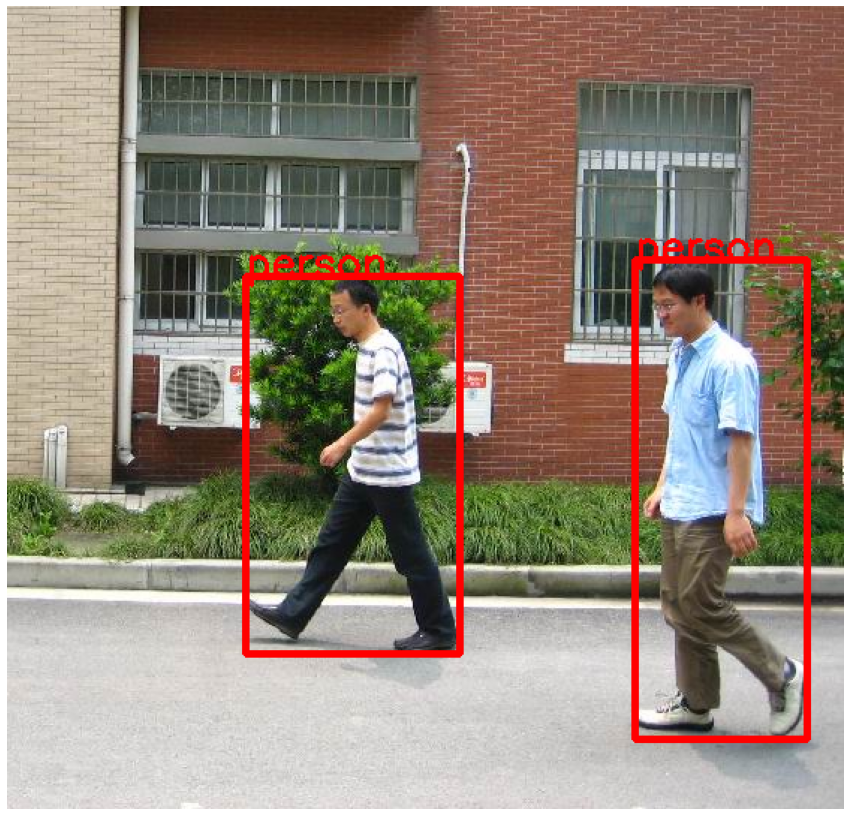

In [11]:
import cv2
plt.figure(figsize=(15,15))
img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
for i in range(len(detection_boxes)):
  cv2.rectangle(img, detection_boxes[i][0], detection_boxes[i][1],color=(255,0,0), thickness=3)
  cv2.putText(img, detection_labels[i], detection_boxes[i][0], cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255,0,0), thickness=2)
plt.imshow(img)
plt.axis('off')

# Bringing it together

Dictionary of models of synchronous runs

In [12]:
models = {}
for model_name in ['fasterrcnn','maskrcnn','yolov8']:
  if model_name == 'maskrcnn':
    weights = MaskRCNN_ResNet50_FPN_Weights.DEFAULT
    model = maskrcnn_resnet50_fpn(weights=weights)
    model.eval()

  if model_name == 'fasterrcnn':
    weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
    model = fasterrcnn_resnet50_fpn(weights=weights)
    model.eval()

  if model_name == 'yolov8':
    model = YOLO('yolov8n.pt')

  models[model_name] = model

In [13]:
from PIL import Image
def predict_image(img_path, model_name): # Take in the image path as a str, and the model name as a str
  if model_name != 'yolov8':
    img = Image.open(img_path).convert('RGB')
    transforms = weights.transforms()
    img = transforms(img)
    detection_outputs = models[model_name](img.unsqueeze(0))
    detection_labels = [COCO_LABEL_NAMES[x] for x in list(detection_outputs[0]['labels'].numpy())]
    detection_boxes = [[(int(x[0]), int(x[1])), (int(x[2]), int(x[3]))] for x in list(detection_outputs[0]['boxes'].detach().numpy())]
  else:
    outputs = models[model_name](img_path)
    for output in outputs:
      detection_labels = [COCO_LABEL_NAMES[int(x)+1] for x in list(output.boxes.cls)]
      detection_boxes = [[(int(x[0]), int(x[1])), (int(x[2]), int(x[3]))] for x in list(output.boxes.xyxy)]
  plt.figure(figsize=(15,15))
  img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
  for i in range(len(detection_boxes)):
    cv2.rectangle(img, detection_boxes[i][0], detection_boxes[i][1],color=(255,0,0), thickness=3)
    cv2.putText(img, detection_labels[i], detection_boxes[i][0], cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255,0,0), 2, cv2.LINE_AA)
  cv2.putText(img, model_name, (32,32), cv2.FONT_HERSHEY_TRIPLEX, 0.9, (0,255,0), 2, cv2.LINE_AA)
  plt.imshow(img)
  plt.axis('off')

Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs


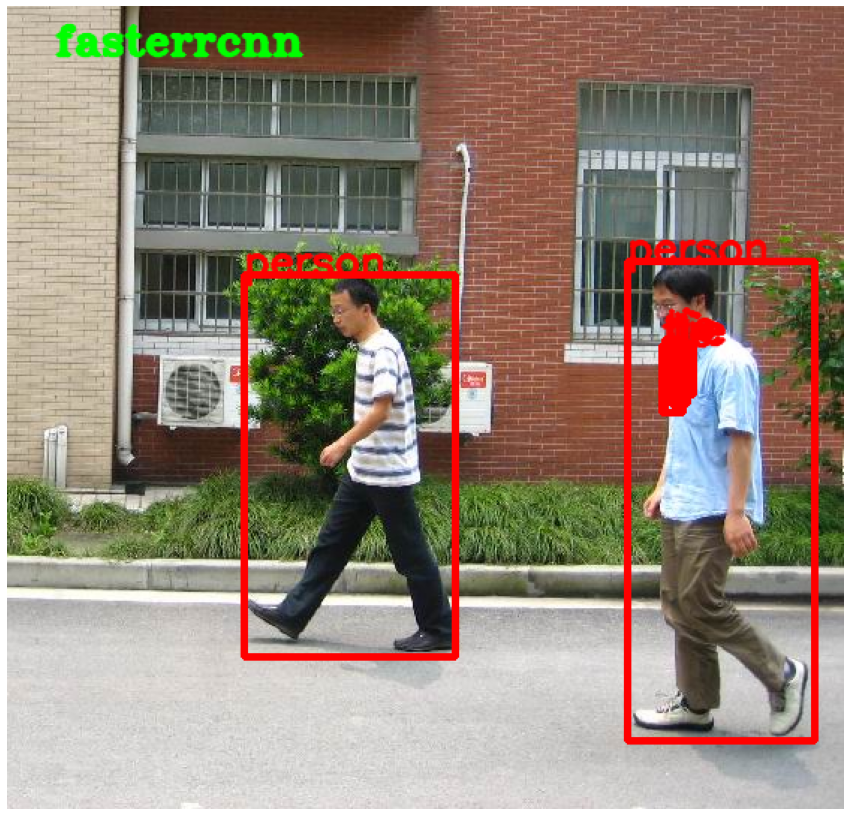

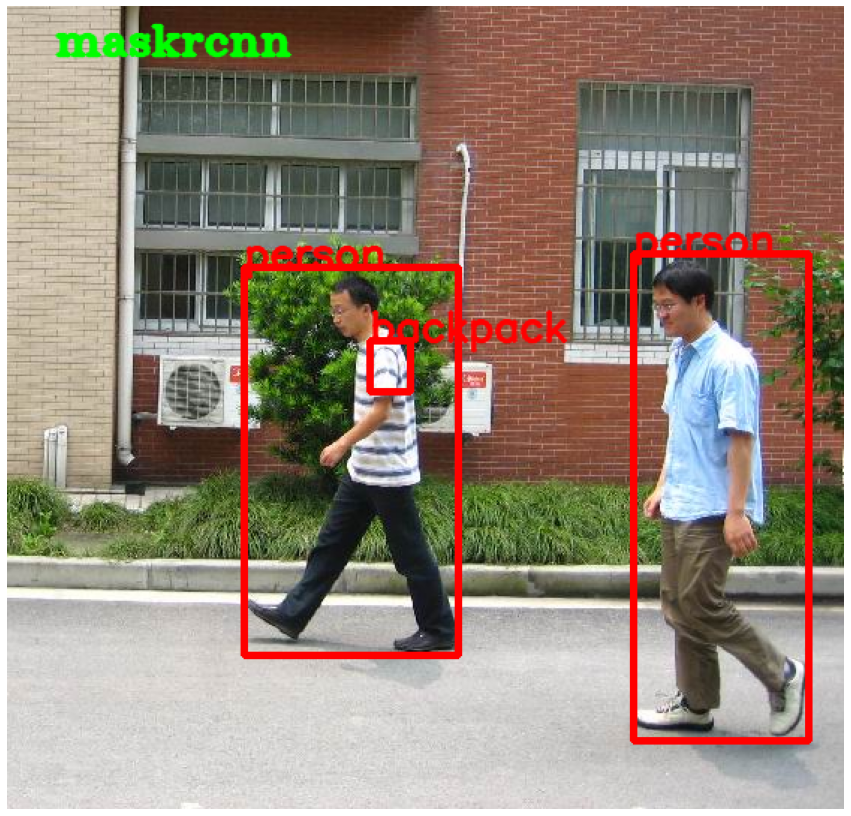

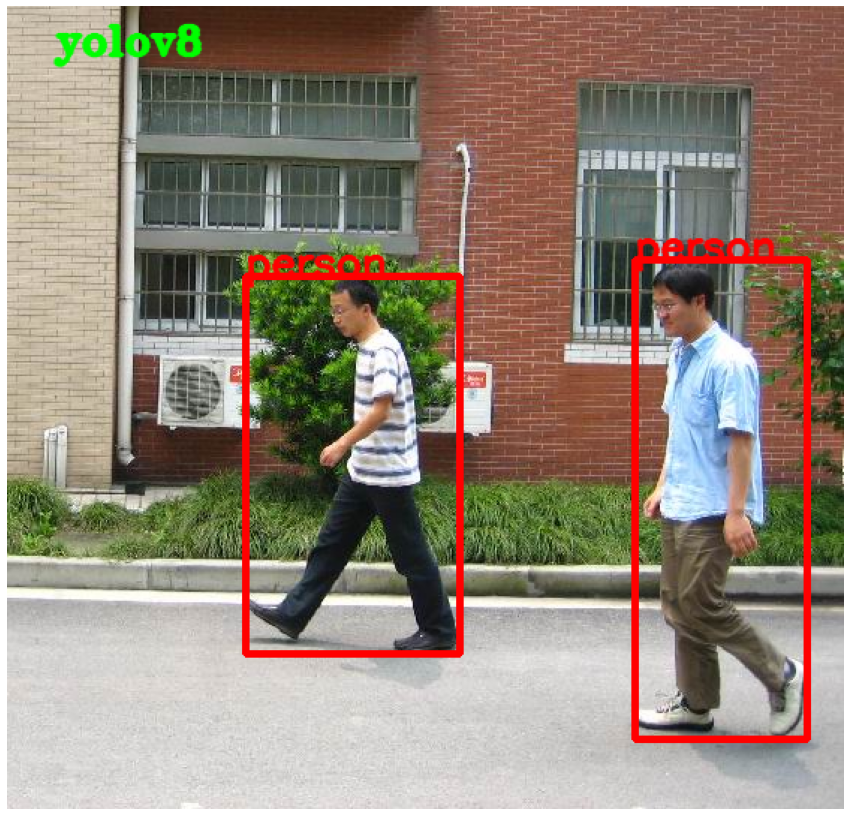

In [14]:
img_path = 'PennFudanPed/PNGImages/FudanPed00001.png'
for model_name in ['fasterrcnn','maskrcnn','yolov8']:
  predict_image(img_path, model_name)

# Testing images outside the pedestrian image set

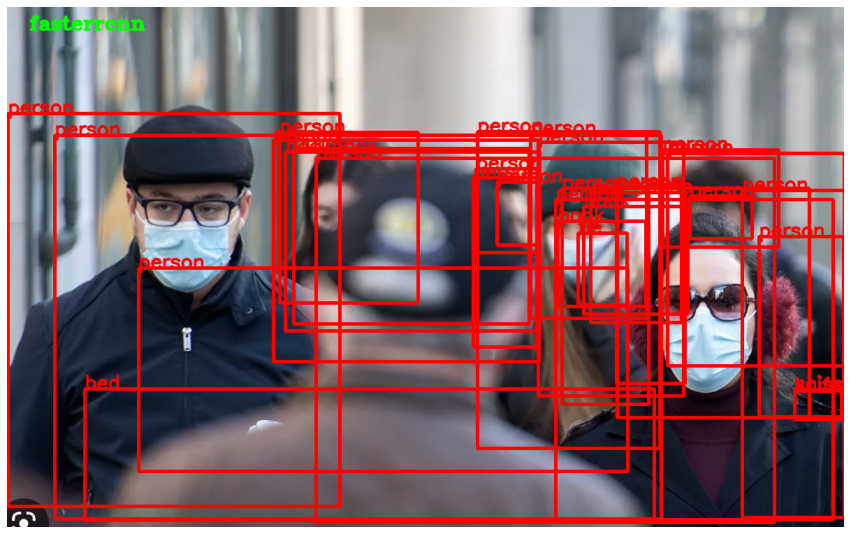

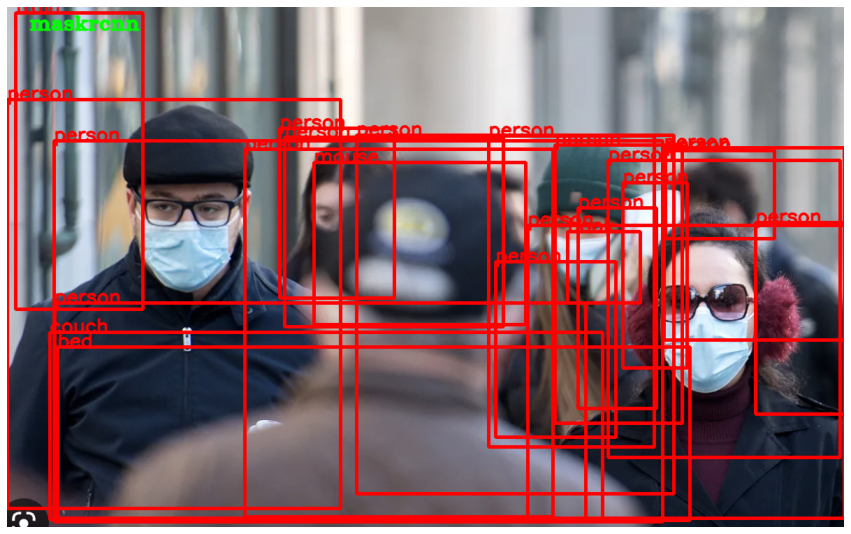

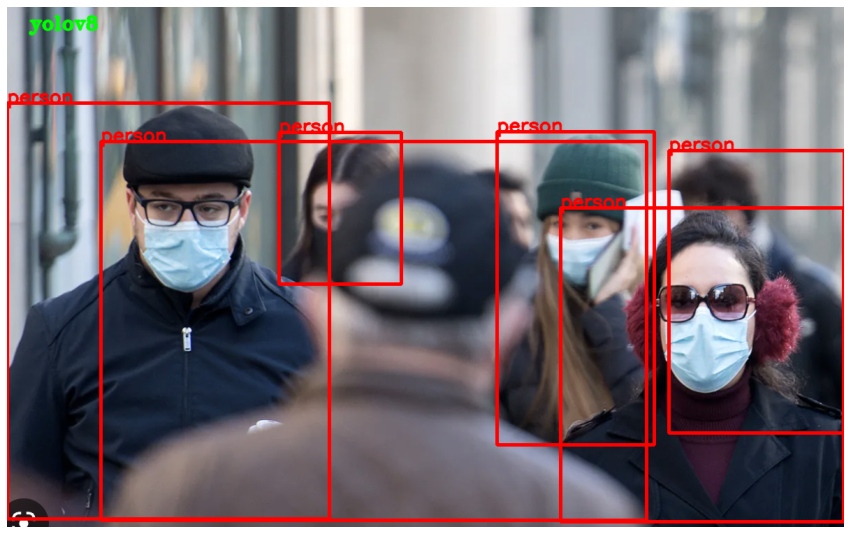

In [15]:
img_path1 = 'people1.png'
for model_name in ['fasterrcnn','maskrcnn','yolov8']:
  predict_image(img_path1, model_name)

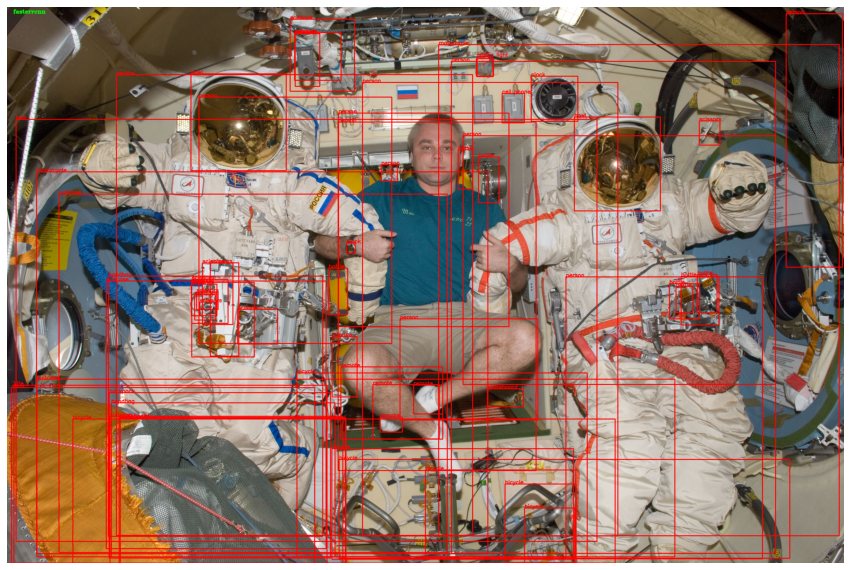

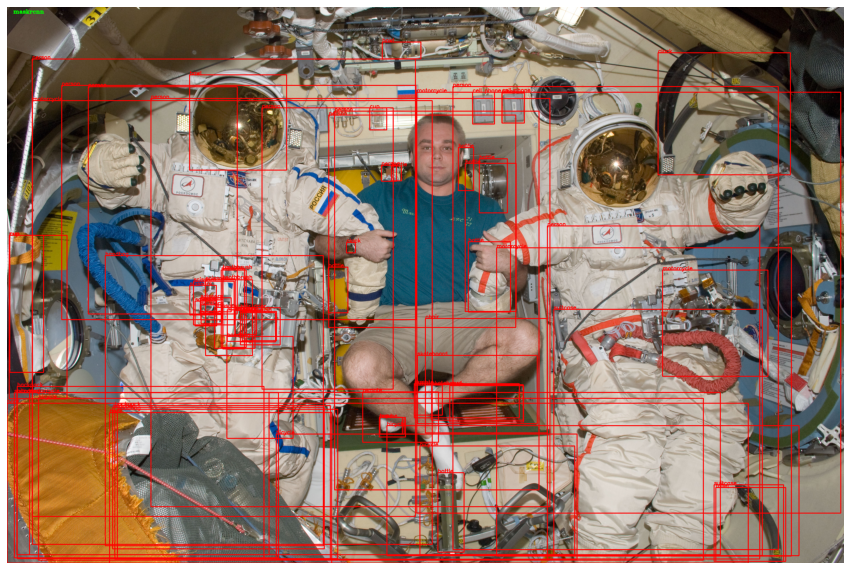

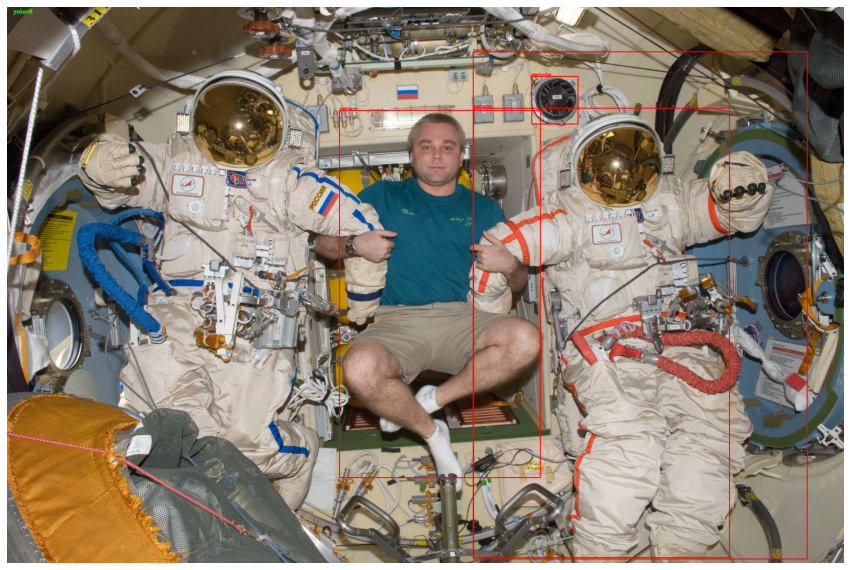

In [16]:
img_path1 = 'people2.jpeg'
for model_name in ['fasterrcnn','maskrcnn','yolov8']:
  predict_image(img_path1, model_name)

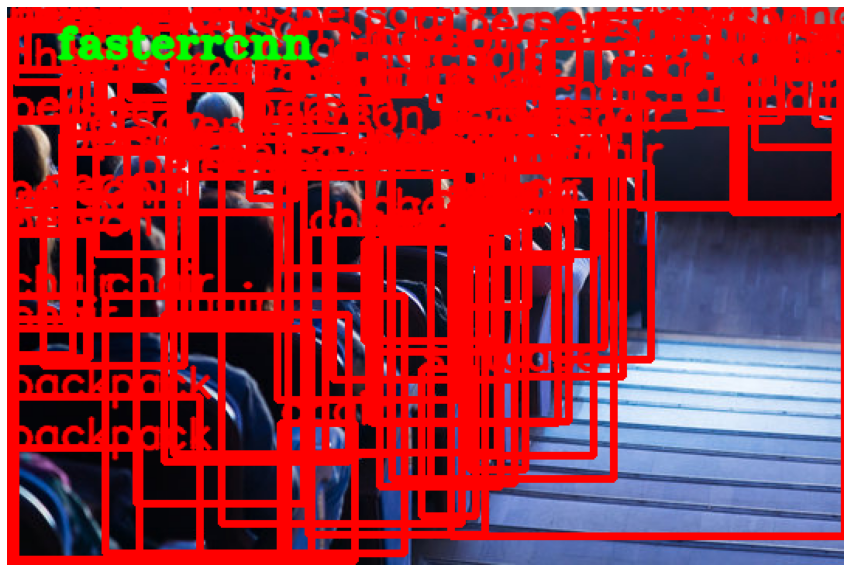

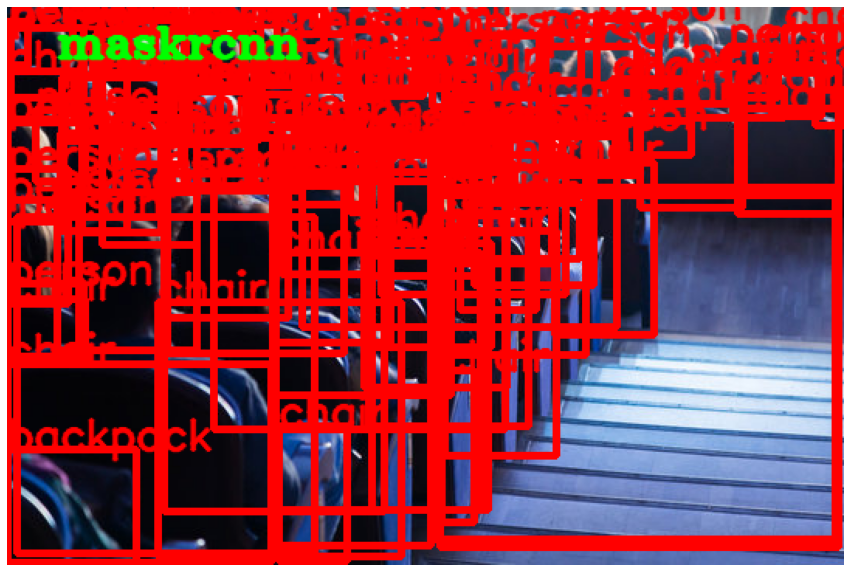

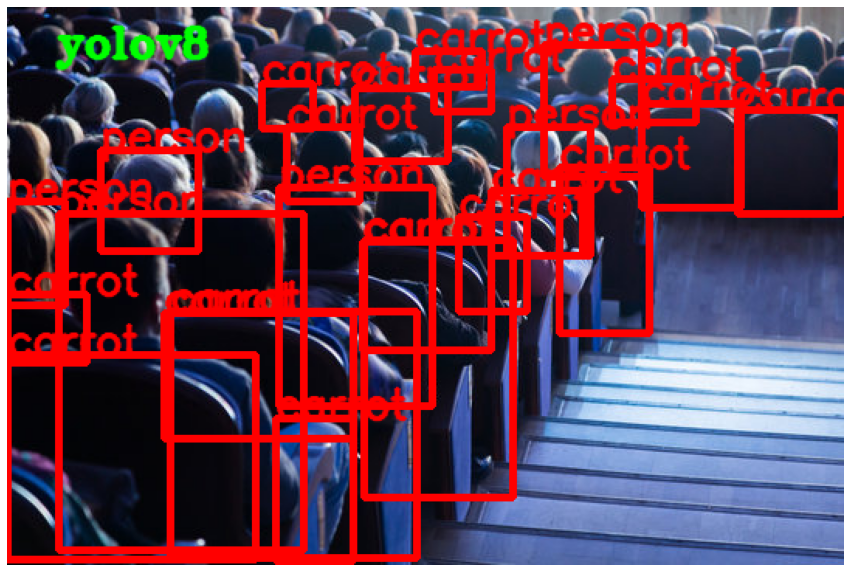

In [17]:
img_path1 = 'people3.jpeg'
for model_name in ['fasterrcnn','maskrcnn','yolov8']:
  predict_image(img_path1, model_name)

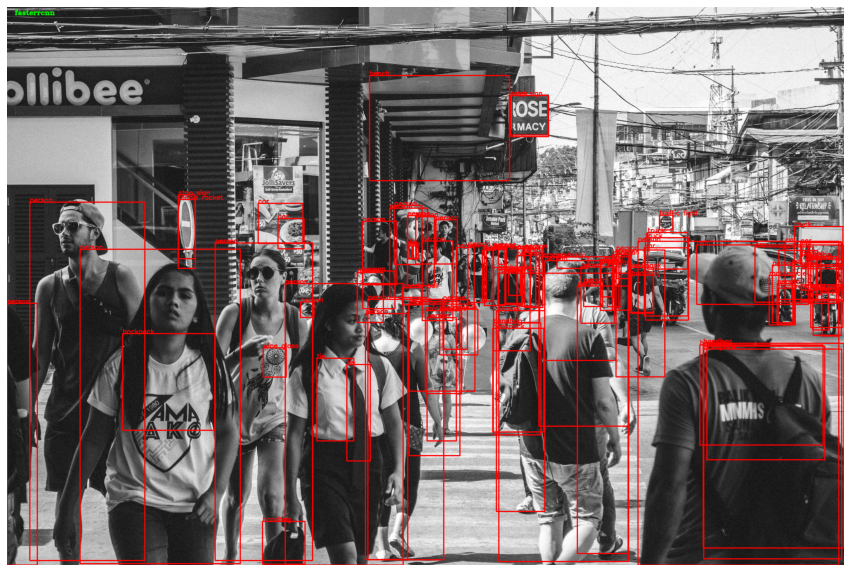

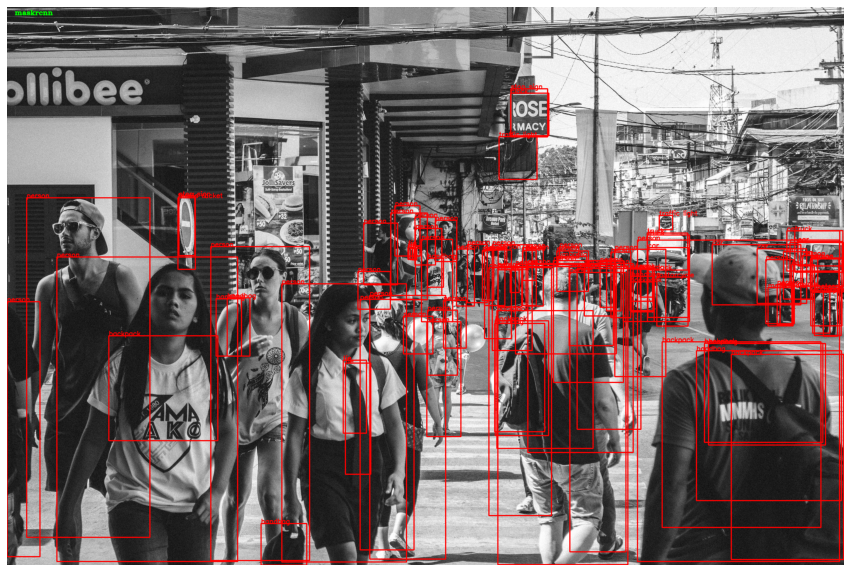

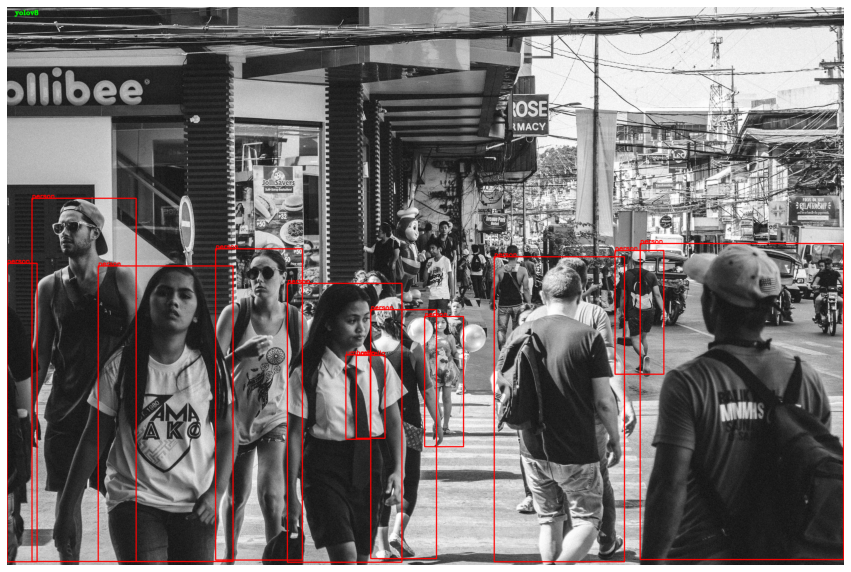

In [18]:
img_path1 = 'people4.jpeg'
for model_name in ['fasterrcnn','maskrcnn','yolov8']:
  predict_image(img_path1, model_name)

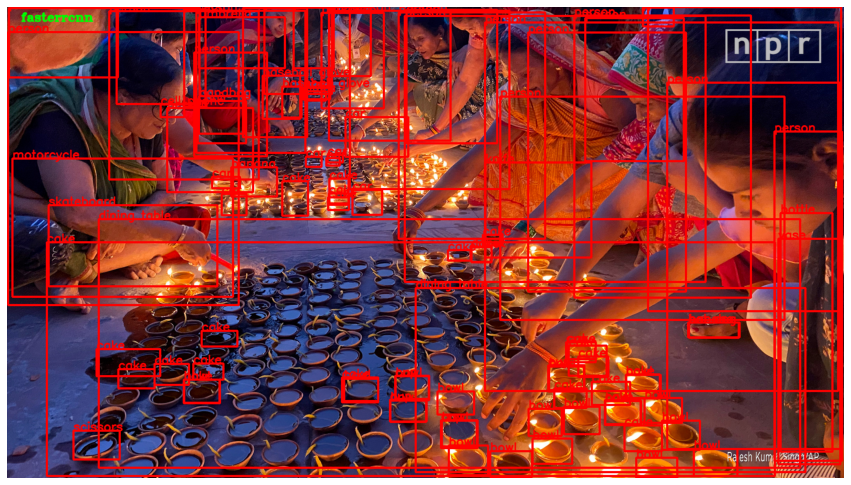

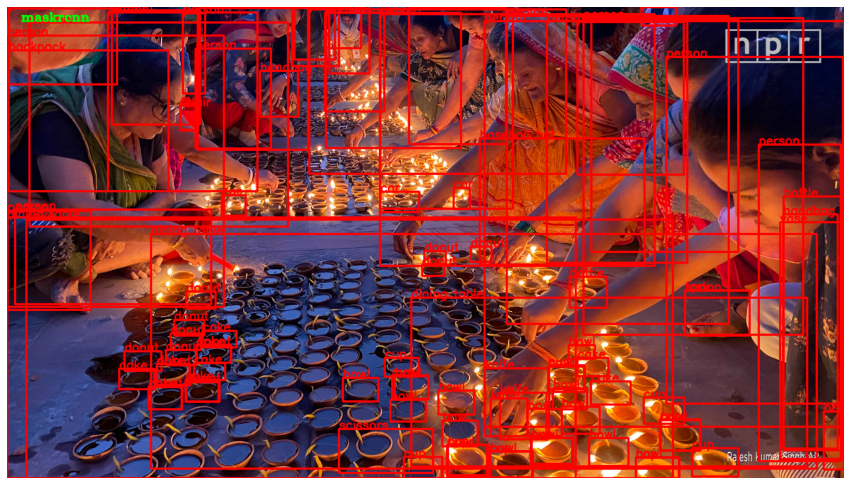

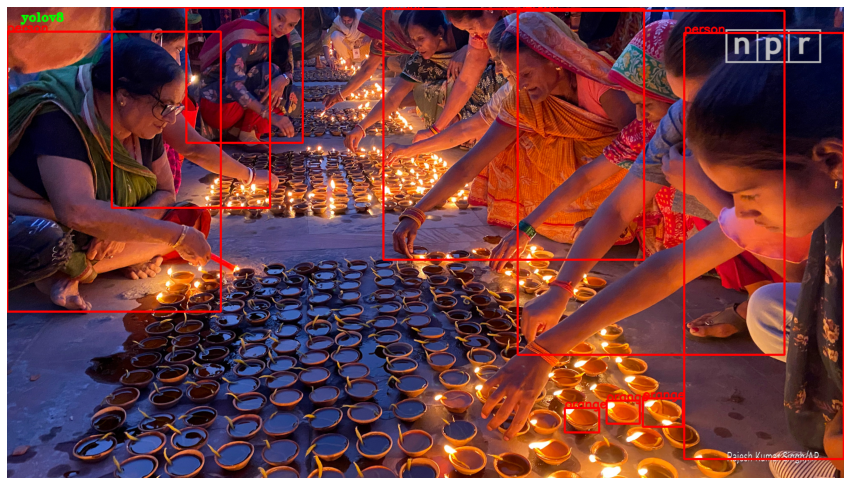

In [19]:
img_path1 = 'people5.jpeg'
for model_name in ['fasterrcnn','maskrcnn','yolov8']:
  predict_image(img_path1, model_name)